# Exploration - Classification *[DEPRECATED]*

This notebook is deprecated. Please use the new version of the notebook [CSP XDAWN](./../pipeline_xdawn_csp.ipynb)

Dans ce notebook, il y a 3 grandes parties totalement indépendantes

- Une première partie classification: 
    - Preprocessing :
        - Filtrage spatiale sur les électrodes du cortex moteur
        - Filtrage temporel sur la bande de fréquence [1, 50] Hz

    - Feature Extraction :
        - Epoching autour des événements d'extension
        - Fenêtres sur chaque époque avec possibilité d'overlapping. Chaque fenêtre est labellisée 1 si le mouvement (considéré comme étant au centre de l'époque) est dans la fenêtre
    
    - Classification avec différentes pipelines. Les métriques utilisées sont juste l'accuracy et la matrice de confusion, sans cross-validation : 
        - CSP + LDA
        - CSP + SVM
        - xDawn + Band Power + Random Forest
    
    
- Une deuxième partie visualisation:
    - set up et chargement des données
    - plusieurs graphiques différents (densité spectrale, EEG, événements sur les EEG, localisation des électrodes, ...)


- Une troisième partie avec quelques éléments du notebook de Fred appliqués à nos données

## Notebook Setup

In [1]:
# Run the following command to install the required packages:
# !pip install -r requirements.txt
# !pip install -e ../src

In [1]:
import os
import pandas as pd
import numpy as np
import mne
from mne import find_events
%matplotlib inline
import matplotlib.pyplot as plt

# Matplotlib settings
plt.rcParams['figure.figsize'] = [5, 5]
plt.rcParams['figure.dpi'] = 150

## Chargement des données

In [2]:
id = '001'

FILE_PATH = '../../data/sample/DATA_'+id+'_Trial1.npy'

In [7]:
from preprocessing.data_loader import DataLoader

data_loader = DataLoader(FILE_PATH)
stroke_side = data_loader.stroke_side

if stroke_side == 'D' :
    raw = data_loader.get_raws(side='G')
    motor_electrods = ['FC1', 'FC3', 'FC5',
                          'C1', 'C3', 'C5',
                          'CP1', 'CP3', 'CP5'
                        ]
    central_electrod = 'C3'
elif stroke_side == 'G' :
    raw = data_loader.get_raws(side='D')
    motor_electrods = ['FC2', 'FC4', 'FC6', 
                         'C2', 'C4', 'C6',
                         'CP2', 'CP4', 'CP6'
                        ]
    central_electrod = 'C4'
else :
    print('Error : stroke_side is not defined')

## Preprocessing

### Filtrage spatial sur le cortex sensori-moteur

In [4]:
raw_motor = raw.copy().pick_channels(motor_electrods)
raw.pick_channels(motor_electrods + ['movement'])

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,67 points
Good channels,"9 EEG, 1 Stimulus"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1024.00 Hz
Highpass,0.00 Hz
Lowpass,512.00 Hz


### Filtrage fréquentiel

In [5]:
raw_motor.filter(l_freq=1, h_freq=50, fir_design='firwin')

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,67 points
Good channels,9 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1024.00 Hz
Highpass,1.00 Hz
Lowpass,50.00 Hz


## Features Extraction

### Epoching autour des événements

In [104]:
# Fonction pour retourner des époques
def get_epochs(raw, f_low=1, f_high=50, tmin=-2, tmax=2):
    # Filter the data
    raw_temp = raw.copy().filter(l_freq=f_low, h_freq=f_high, fir_design='firwin')
    
    # Get the events
    events = find_events(raw_temp, stim_channel='movement')
    
    # Get the epochs
    epochs = mne.Epochs(raw_temp, events, event_id=None, tmin=tmin, tmax=tmax, preload=True, baseline=None)
    
    return epochs
    

In [105]:
def get_windows(epochs, size=1., overlap=0.1):
    # Get the sampling frequency
    sfreq = epochs.info['sfreq']
    
    # Get only motor electrods
    epochs_motor = epochs.copy().pick_channels(motor_electrods)
  
    # Get the size of the window and of the overlap in samples
    w_size = int(size * sfreq)
    w_overlap = int(overlap * sfreq)

    # Get the number of samples, electrod and events
    n_samples = epochs.get_data().shape[2]
    n_electrod = epochs.get_data().shape[1]
    n_events = epochs.get_data().shape[0]
    
    windows = []
    targets = []
    # Events are in the middle of the epoch
    pos_event = int(n_samples/2)

    for event in range(n_events):
        temp_windows = []
        temp_targets = []
        for i in range(0, n_samples - w_size, w_overlap):
            temp_windows.append(epochs_motor.get_data()[event, :, i: i + w_size])
            
            if i <= pos_event <= i + w_size:
                temp_targets.append(1)
            else:
                temp_targets.append(0)
            
        windows.append(np.array(temp_windows))
        targets.append(np.array(temp_targets))
        
    windows = np.concatenate(windows)
    targets = np.concatenate(targets)
        
    return windows, targets

In [106]:
epochs = get_epochs(raw)
windows, targets = get_windows(epochs)

print(windows.shape)
print(targets.shape)
print(np.unique(targets, return_counts=True))

(310, 9, 1024)
(310,)
(array([0, 1]), array([210, 100]))


## Classification - MNE

### LDA et CSP

In [60]:
import numpy as np
from sklearn.model_selection import ShuffleSplit, cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from mne.decoding import CSP

# Assemble a classifier
lda = LinearDiscriminantAnalysis()                            
csp = CSP(n_components=4, reg=None, log=True, norm_trace=False)

# Use scikit-learn Pipeline
clf = Pipeline([('CSP', csp), ('LDA', lda)]) 

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

# Séparation des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(windows, targets, test_size=0.2, random_state=42)

# Entrainement du modèle
clf.fit(X_train, y_train)

Pipeline(steps=[('CSP',
                 CSP({'component_order': 'mutual_info',
 'cov_est': 'concat',
 'cov_method_params': None,
 'log': True,
 'n_components': 4,
 'norm_trace': False,
 'rank': None,
 'reg': None,
 'transform_into': 'average_power'})),
                ('LDA', LinearDiscriminantAnalysis())])

Accuracy: 0.6129032258064516
Confusion Matrix:
[[35  4]
 [20  3]]


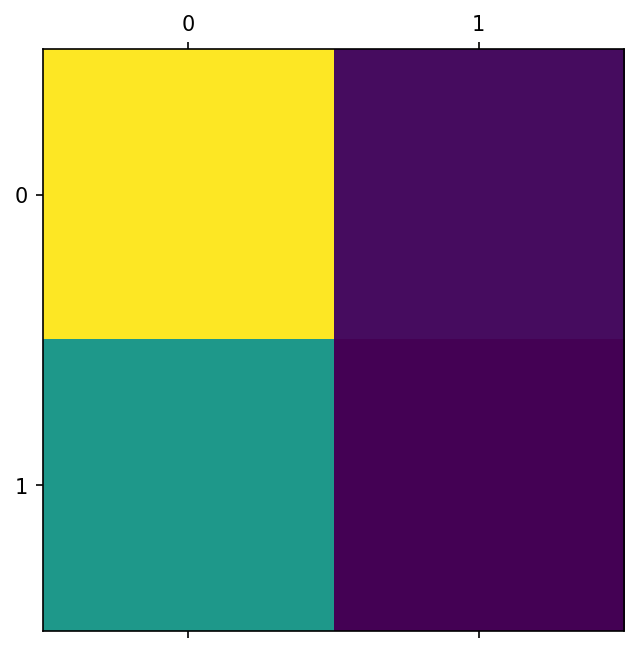

In [62]:
# Prediction
y_pred = clf.predict(X_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Plot the confusion matrix
plt.matshow(conf_matrix)

### CSP + SVM

In [63]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from mne.decoding import CSP

# Assemble a classifier
svc = SVC()                            
csp = CSP(n_components=4, reg=None, log=True, norm_trace=False)

# Use scikit-learn Pipeline
clf = Pipeline([('CSP', csp), ('svc', svc)]) 

In [64]:
# Séparation des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(windows, targets, test_size=0.2, random_state=42)

# Entrainement du modèle
clf.fit(X_train, y_train)

Pipeline(steps=[('CSP',
                 CSP({'component_order': 'mutual_info',
 'cov_est': 'concat',
 'cov_method_params': None,
 'log': True,
 'n_components': 4,
 'norm_trace': False,
 'rank': None,
 'reg': None,
 'transform_into': 'average_power'})),
                ('svc', SVC())])

Accuracy: 0.7096774193548387
Confusion Matrix:
[[37  2]
 [16  7]]


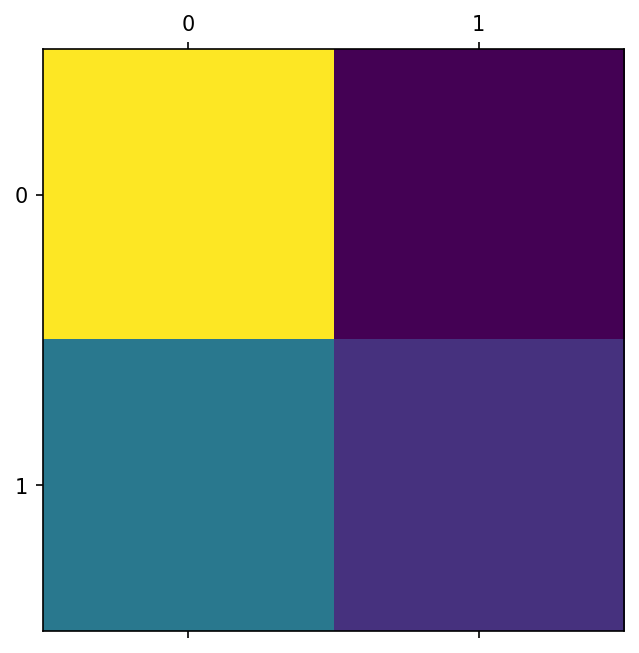

In [65]:
# Prediction
y_pred = clf.predict(X_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Plot the confusion matrix
plt.matshow(conf_matrix)

### xDAWN + BandPower + RF

In [107]:
# xDAWN
from mne.preprocessing import Xdawn

# Convert to epochs
n_channels = len(motor_electrods)
ch_names = motor_electrods
ch_types = ['eeg'] * n_channels
sfreq = epochs.info['sfreq']
info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types=ch_types)

epochs_xdawn = mne.EpochsArray(windows, info)

# Apply xDANW
xdawn = Xdawn(n_components=4)
xdawn.fit(epochs_xdawn)
epochs_denoised = xdawn.apply(epochs_xdawn)['1']

# Convert to windows
windows = epochs_denoised.get_data()

In [108]:
# BandPower feature extraction

n_epochs, n_channels, n_times = epochs_denoised.get_data().shape

# Initialize an array to hold the band-specific data
band_data = np.zeros((n_epochs, n_channels*4, n_times))

# Defines the frequency bands
bands = {
    'theta': [4, 8],
    'alpha': [8, 13],
    'beta': [13, 30],
    'gamma': [30, 45]
} 

# Loop over each band and filter

for i, (band_name, band) in enumerate(bands.items()):
    # Apply the bandpass filter
    epochs_band = epochs_denoised.copy().filter(l_freq=band[0], h_freq=band[1])
    
    # Get the band-specific data
    band_data[:, i*n_channels:(i+1)*n_channels, :] = epochs_band.get_data()
    
print(band_data.shape)

(310, 36, 1024)


In [109]:
# Random forest

from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier()
windows = band_data.reshape(n_epochs, -1)


In [110]:
# Séparation des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(windows, targets, test_size=0.2, random_state=42)

# Entrainement du modèle
clf.fit(X_train, y_train)

RandomForestClassifier()

Accuracy: 0.6612903225806451
Confusion Matrix:
[[38  1]
 [20  3]]


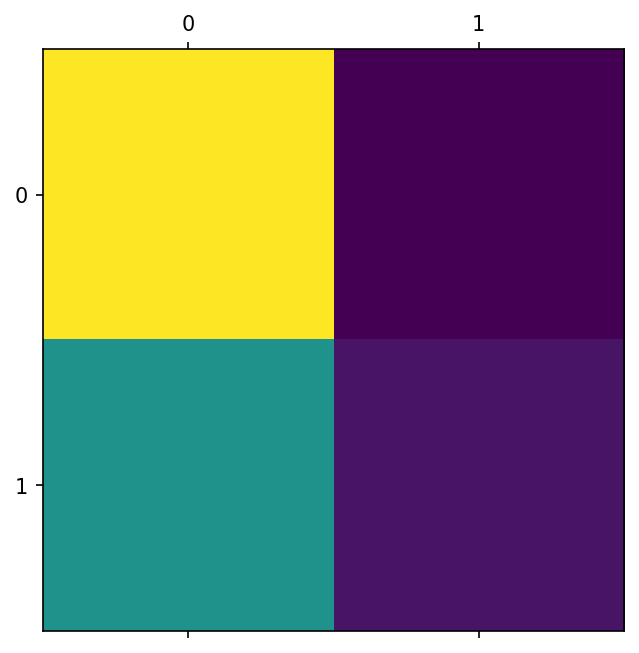

In [112]:
# Prediction
y_pred = clf.predict(X_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Plot the confusion matrix
plt.matshow(conf_matrix)

# Quelques visualisations

### Set up et Chargement des données

In [32]:
import os
import pandas as pd
import numpy as np
import mne
from mne import find_events
%matplotlib inline
import matplotlib.pyplot as plt

# Matplotlib settings
plt.rcParams['figure.figsize'] = [5, 5]
plt.rcParams['figure.dpi'] = 150

In [63]:
id = '001'

FILE_PATH = '../../data/sample/DATA_'+id+'_Trial1.npy'

from preprocessing.data_loader import DataLoader

data_loader = DataLoader(FILE_PATH)
stroke_side = data_loader.stroke_side

if stroke_side == 'D' :
    raw = data_loader.get_raws(side='G')
    motor_electrods = ['FC1', 'FC3', 'FC5',
                          'C1', 'C3', 'C5',
                          'CP1', 'CP3', 'CP5'
                        ]
    central_electrod = 'C3'
elif stroke_side == 'G' :
    raw = data_loader.get_raws(side='D')
    motor_electrods = ['FC2', 'FC4', 'FC6', 
                         'C2', 'C4', 'C6',
                         'CP2', 'CP4', 'CP6'
                        ]
    central_electrod = 'C4'
else :
    print('Error : stroke_side is not defined')

### Vitesse et accélération

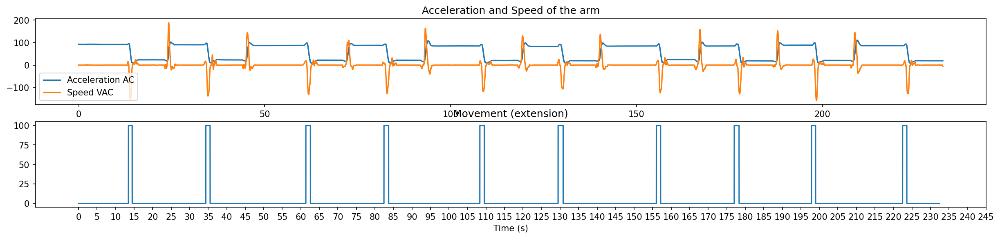

In [65]:


fig, axes = plt.subplots(2, 1, figsize=(20, 4))
axes[0].plot(raw.times, raw['AC'][0][0], label='Acceleration AC')
axes[0].plot(raw.times, raw['VAC'][0][0], label='Speed VAC')
axes[0].set_title('Acceleration and Speed of the arm')
axes[0].legend()
axes[1].plot(raw.times, raw['movement'][0][0]*100)
axes[1].set_title('Movement (extension)')
axes[1].xaxis.set_ticks(np.arange(0, 250, 5))
axes[1].set_xlabel('Time (s)')
plt.show()



### EEG

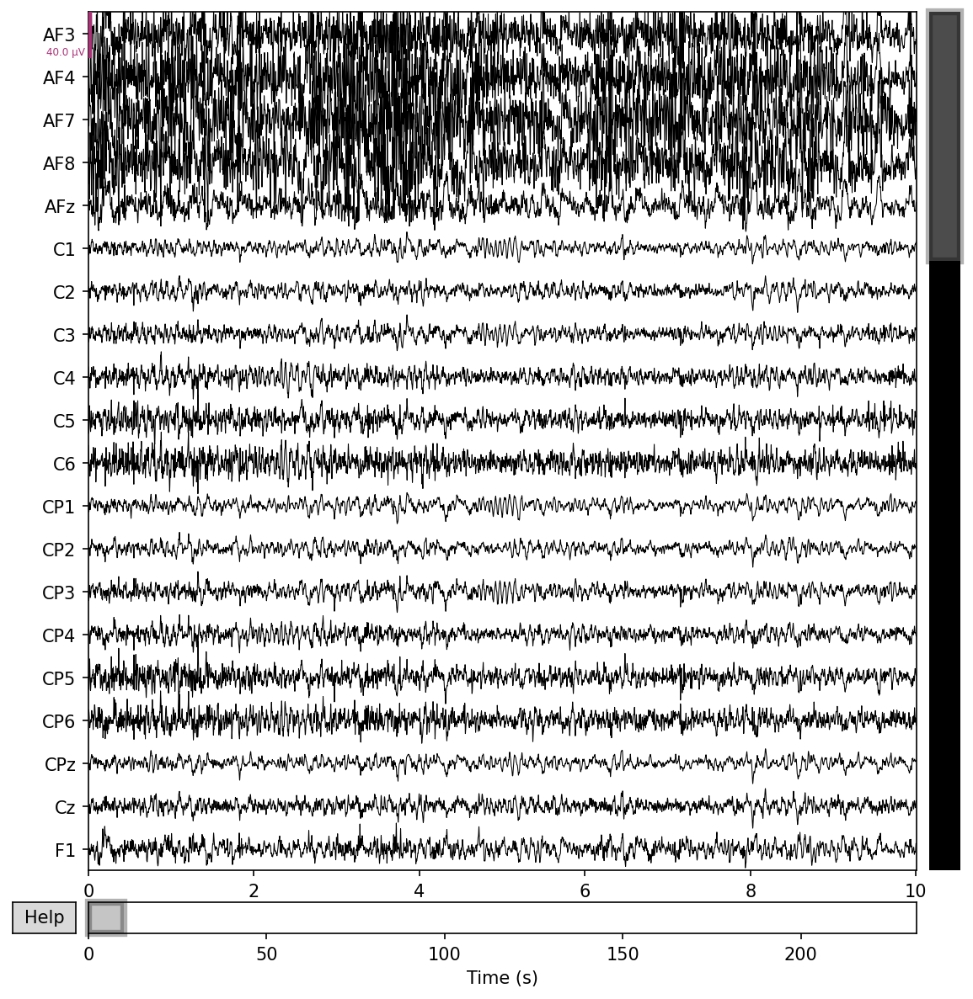

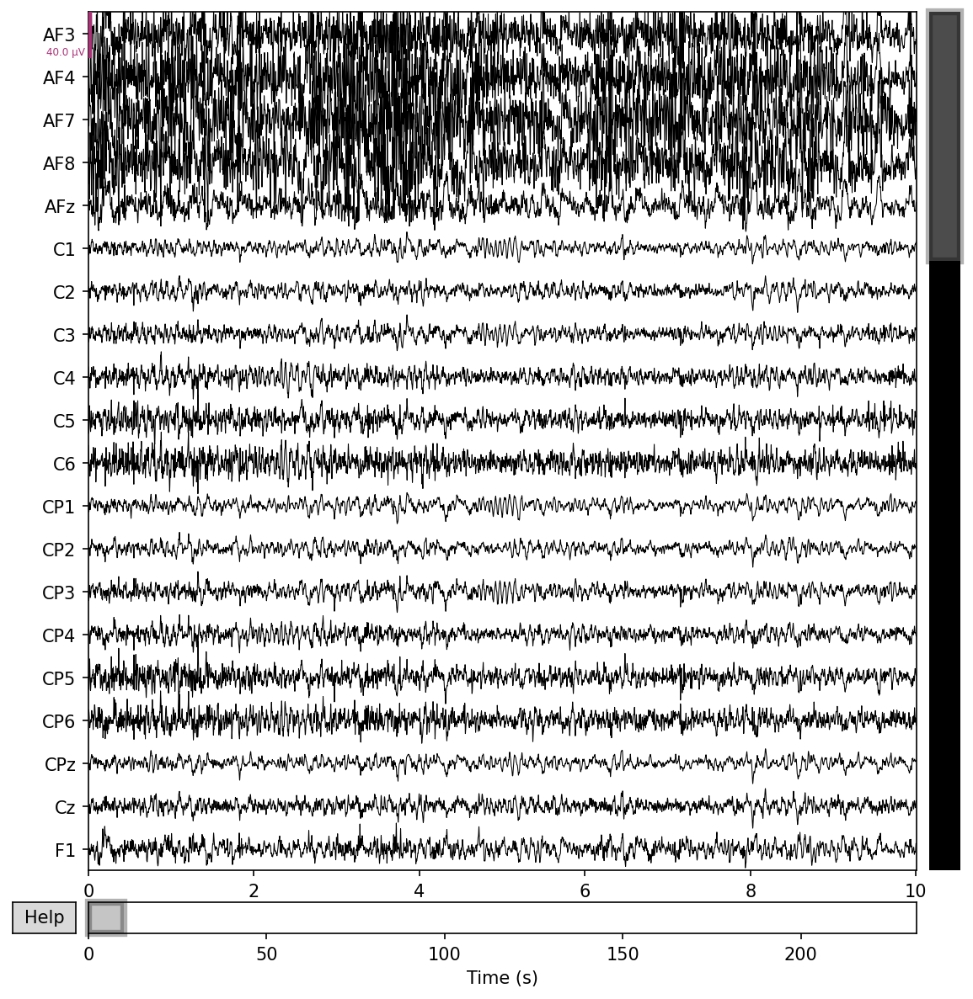

In [67]:
raw.plot()

### Spectrogramme

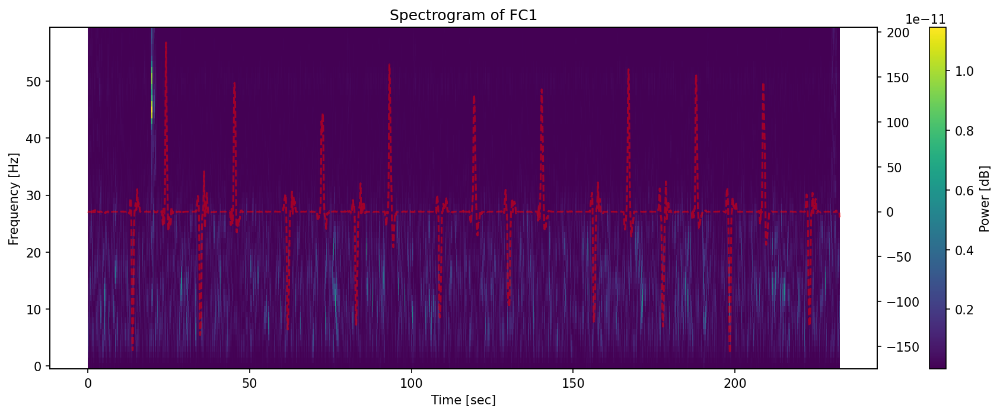

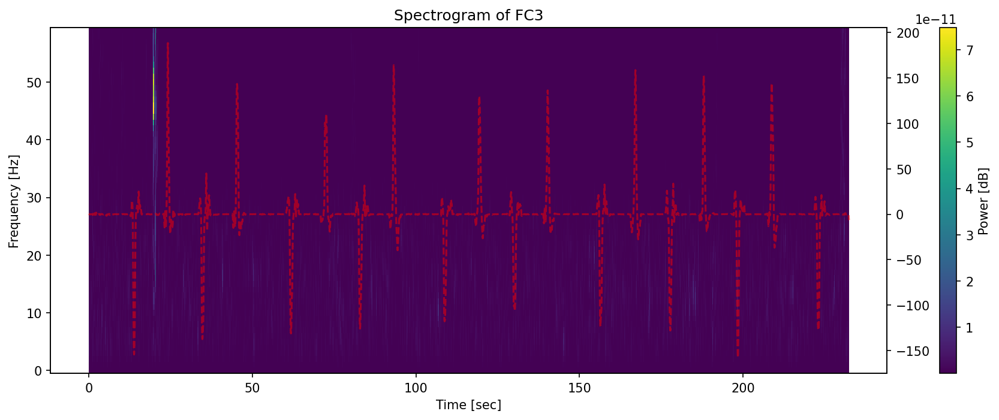

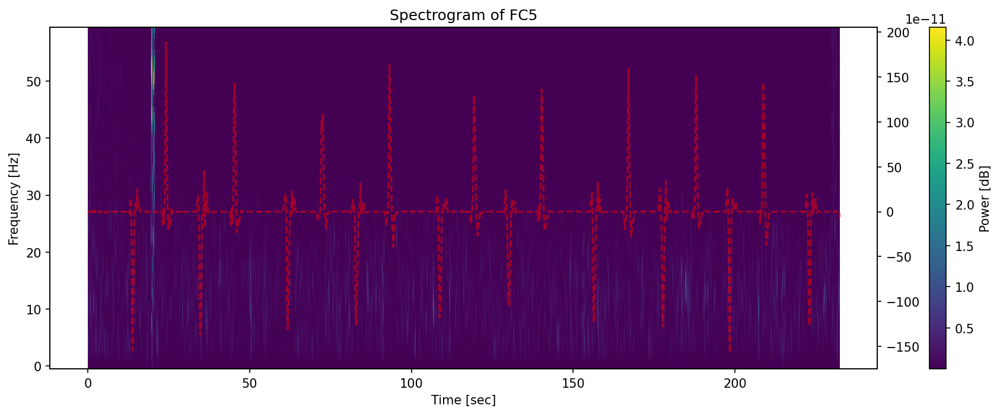

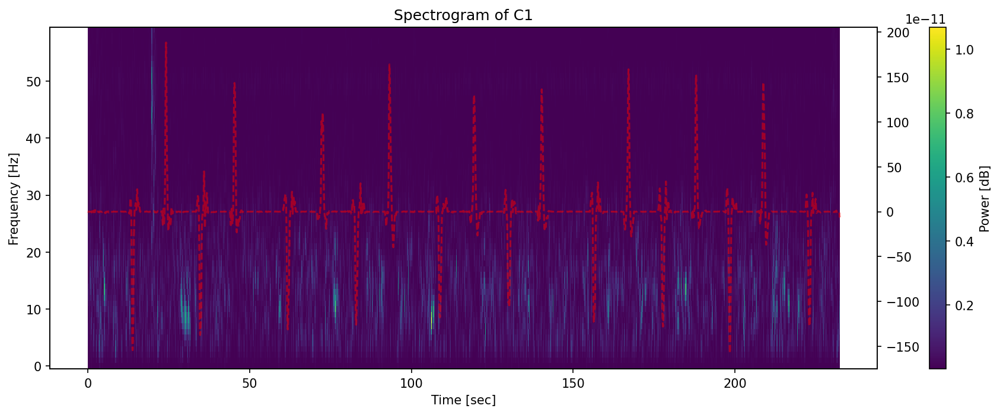

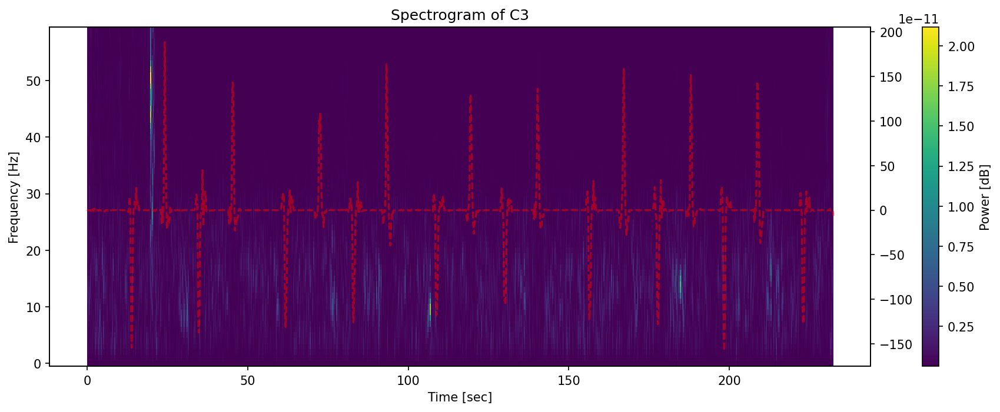

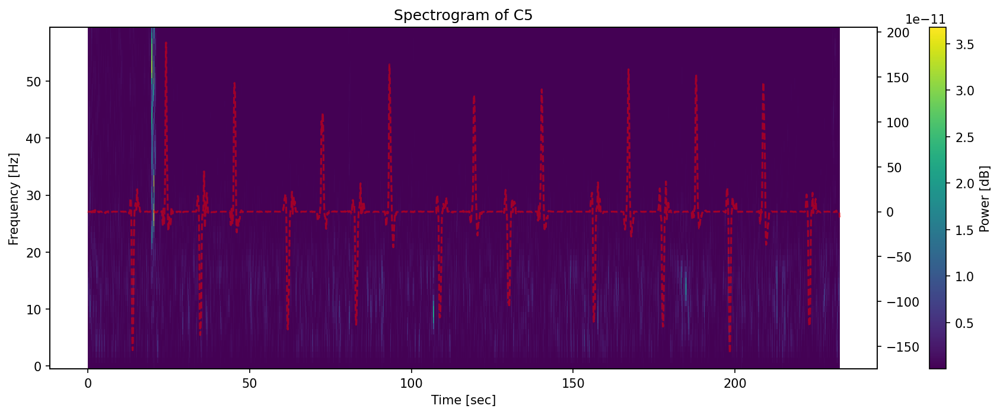

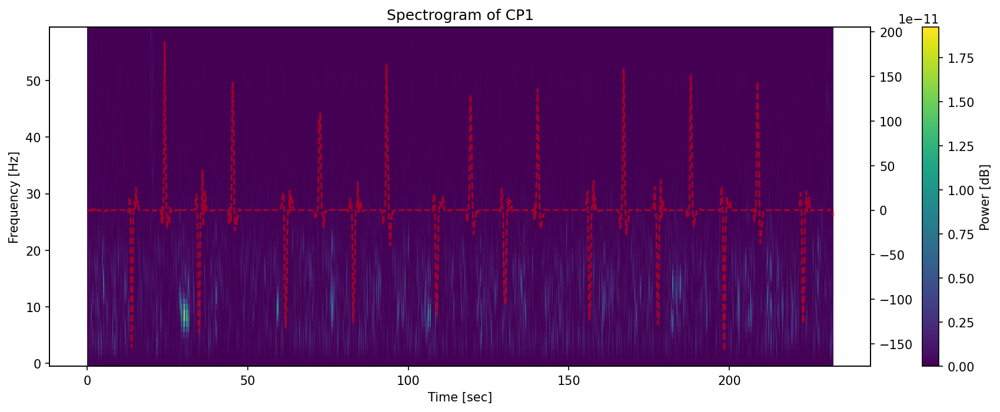

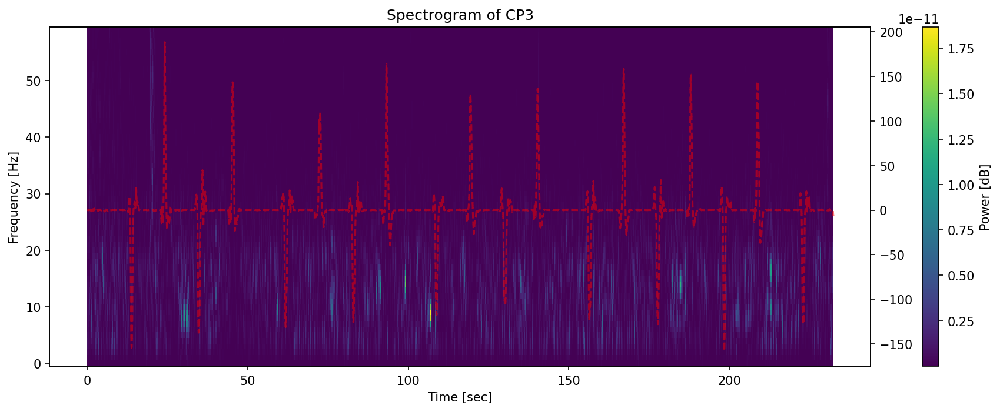

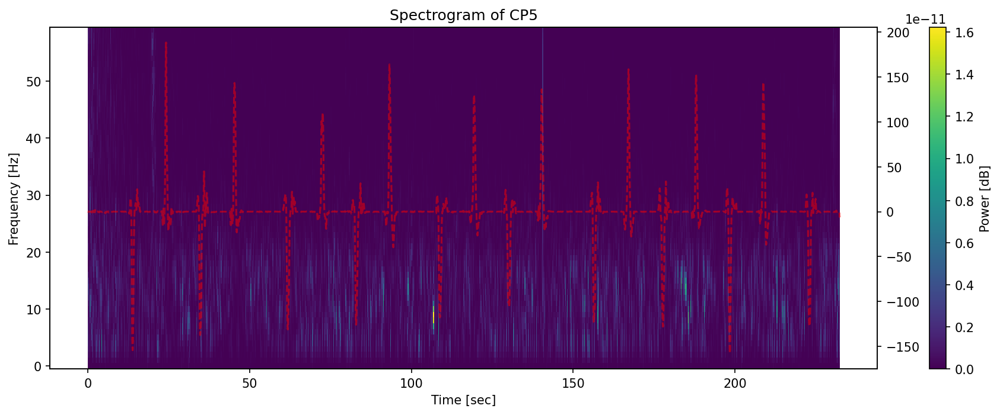

In [69]:
from scipy import signal
for electrod in motor_electrods :
    f, t, Sxx = signal.spectrogram(raw[electrod][0][0], raw.info['sfreq'], nfft=1024)
    # Low pass frequency filter
    threshold_frequence = 60
    mask = f<threshold_frequence
    f = f[mask]
    Sxx = Sxx[mask,:]
    
    # Plot
    plt.figure(figsize=(15, 5))
    plt.pcolormesh(t, f, Sxx)
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.title(f'Spectrogram of {electrod}')
    plt.colorbar(label='Power [dB]')

    # Add arm speed
    plt.twinx()
    plt.plot(raw.times, raw['VAC'][0][0], '--', color='red', alpha=0.5, label='arm speed')
    
    # plt.xlim(70, 80)

### Localisation des électrodes

<Info | 8 non-empty values
 bads: []
 ch_names: AF3, AF4, AF7, AF8, AFz, C1, C2, C3, C4, C5, C6, CP1, CP2, CP3, ...
 chs: 64 EEG
 custom_ref_applied: False
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 0.0 Hz
 lowpass: 512.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 1024.0 Hz
>


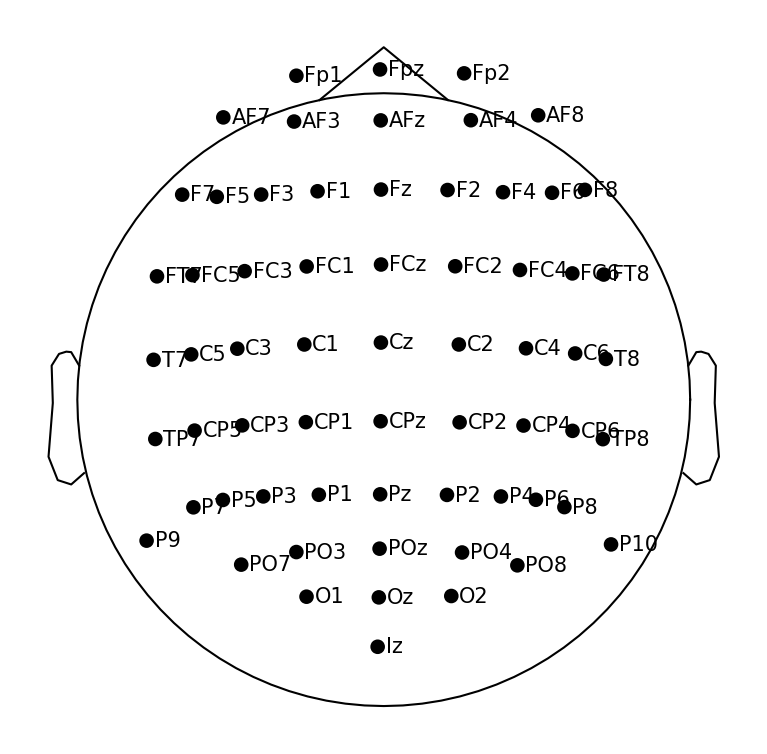

In [71]:
# Create an info structure with only the number of channels
channels_to_exclude = ['AC', 'VAC', 'AC3d', 'VAC3d', 'movement']
raw_channels = raw.copy().pick_channels([ch for ch in raw.ch_names if ch not in channels_to_exclude])
info = mne.create_info(ch_names=raw_channels.ch_names, sfreq=raw.info['sfreq'], ch_types='eeg')
 
# Apply the 10-20 montage
montage = mne.channels.make_standard_montage('standard_1020')
info.set_montage(montage)

# Create a new RawArray with the updated info
raw_channels = mne.io.RawArray(raw_channels.get_data(), info)

# Show information about the updated RawArray
print(raw_channels.info)

# display the montage (sensors on the scalp)
plt.rcParams['figure.dpi'] = 150
#raw.plot_sensors(ch_type='eeg',show_names=True, kind='3d')
#plt.show()
raw_channels.plot_sensors(ch_type='eeg',show_names=True)
plt.show()

### EEG par channel

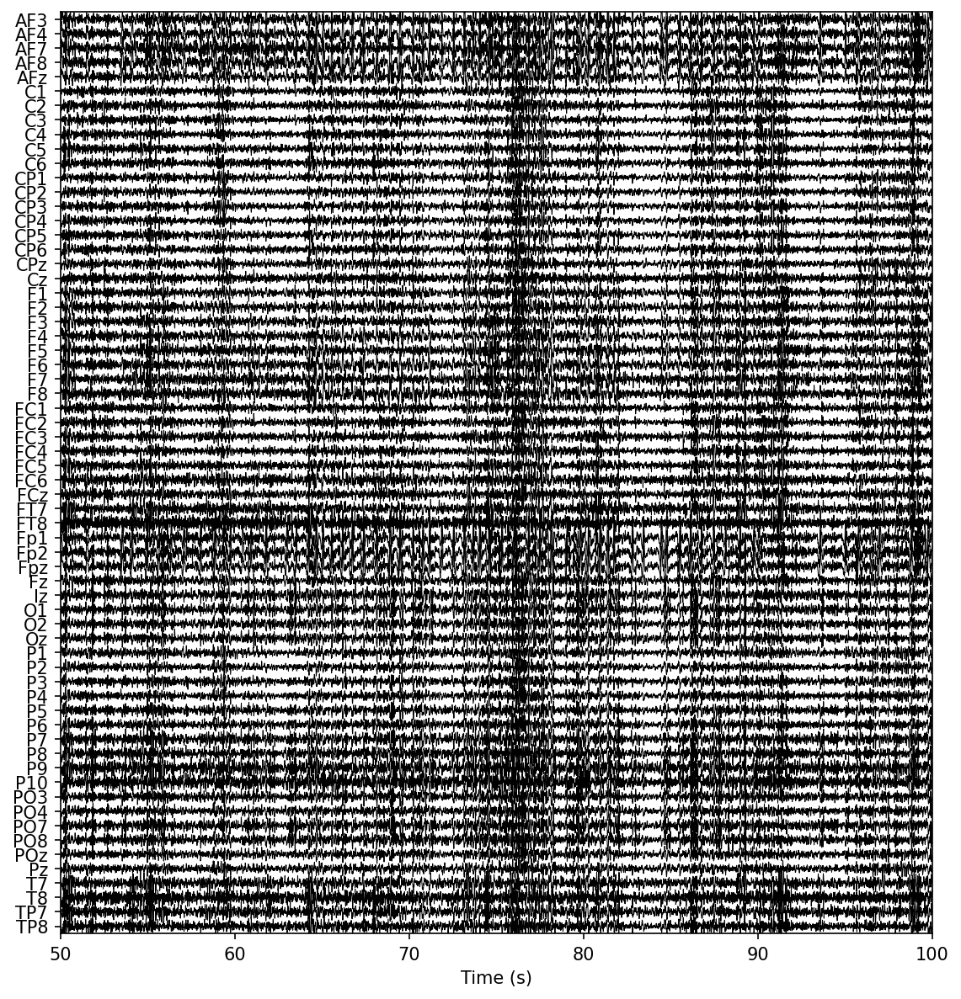

In [73]:
plt.rcParams['figure.dpi'] = 150
scal = dict(eeg=1e-5)                      # EDIT ME!
raw_channels.plot(n_channels=64, scalings=scal,
         start=50, duration=50,             # EDIT ME!
         lowpass=50, highpass=1,          # EDIT ME!
         show_scrollbars=False, show_scalebars=False)
plt.show()

### Événements

In [75]:
from mne import find_events

# Get the event (left / right hand) by looking at the "stim" channel.
events = find_events(raw, stim_channel='movement')
events


array([[ 13792,      0,      1],
       [ 35181,      0,      1],
       [ 62837,      0,      1],
       [ 84431,      0,      1],
       [110940,      0,      1],
       [132574,      0,      1],
       [159739,      0,      1],
       [181267,      0,      1],
       [202640,      0,      1],
       [227797,      0,      1]])

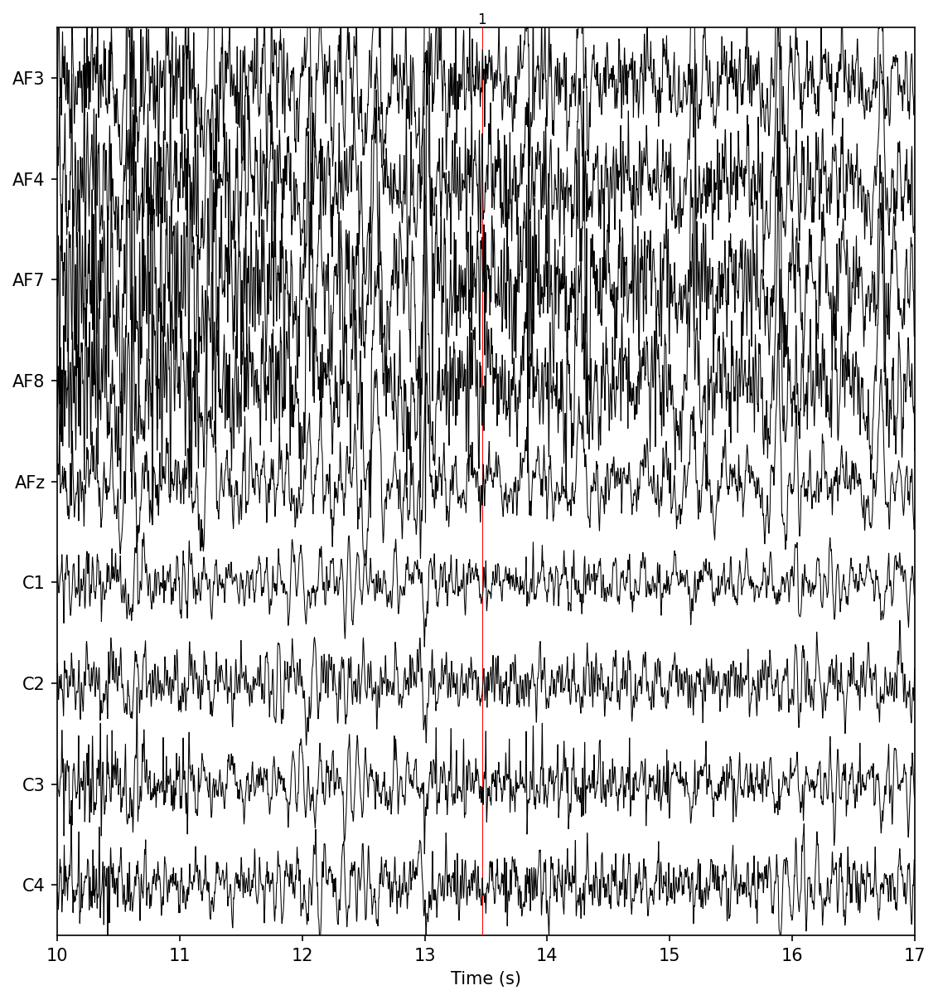

In [78]:
# Display tge EEG signals with the events 
scal = dict(eeg=1e-5)     # EDIT ME!
plt.rcParams['figure.dpi'] = 150
raw.plot(events=events, event_color='red',
         scalings=scal, clipping=None, show_scrollbars=False, show_scalebars=False, 
         start=10,       # EDIT ME!
         duration=7,     # EDIT ME!
         n_channels=9)   # EDIT ME!
plt.show()

### Densité spectrale

/Users/lynarayanne/opt/anaconda3/envs/eeg-stroke/lib/python3.11/site-packages/mne/viz/utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


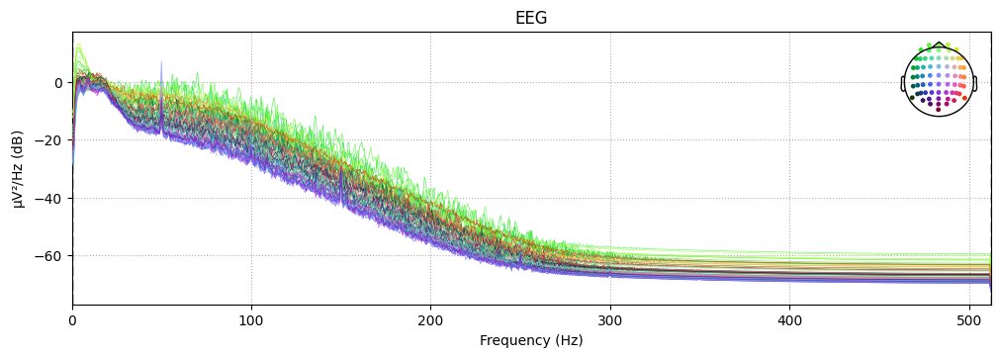

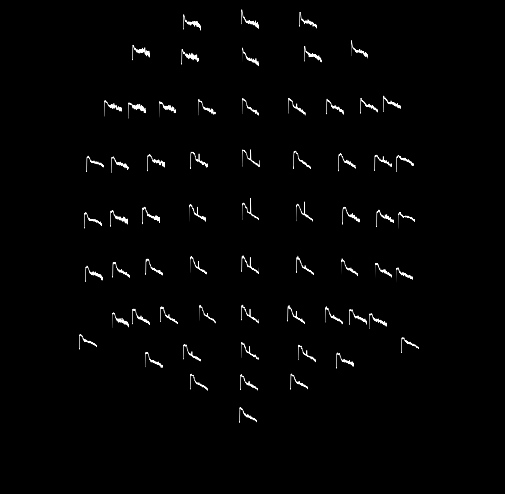

In [81]:
raw.plot_psd()
plt.rcParams['figure.dpi'] = 100
raw.plot_psd_topo()
plt.show()

# Exploration - BE MI (Frederic Dehais)

## Setup

In [2]:
import os, sys
import matplotlib.pyplot as plt
import os
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

class HiddenPrints:
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')
    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout

In [3]:
PATH_DATA_FOLDER = os.path.join(os.getcwd(), '../data')
PATH_DATA_SAMPLE_FOLDER = f'{PATH_DATA_FOLDER}/sample'
FILE_PATH = f'{PATH_DATA_SAMPLE_FOLDER}/DATA_001_Trial1.npy'

from preprocessing.data_loader import DataLoader
from preprocessing.data_processor import DataProcessor

loader = DataLoader(FILE_PATH)
data = loader.get_data()
processor = DataProcessor(data)

Creating RawArray with float64 data, n_channels=64, n_times=237960
    Range : 0 ... 237959 =      0.000 ...   232.382 secs
Ready.
Creating RawArray with float64 data, n_channels=64, n_times=249283
    Range : 0 ... 249282 =      0.000 ...   243.439 secs
Ready.


## Motor Imagery Dataset

### Explore the sensor locations

Creating RawArray with float64 data, n_channels=64, n_times=237960
    Range : 0 ... 237959 =      0.000 ...   232.382 secs
Ready.
<Info | 8 non-empty values
 bads: []
 ch_names: AF3, AF4, AF7, AF8, AFz, C1, C2, C3, C4, C5, C6, CP1, CP2, CP3, ...
 chs: 64 EEG
 custom_ref_applied: False
 dig: 67 items (3 Cardinal, 64 EEG)
 highpass: 0.0 Hz
 lowpass: 512.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 1024.0 Hz
>


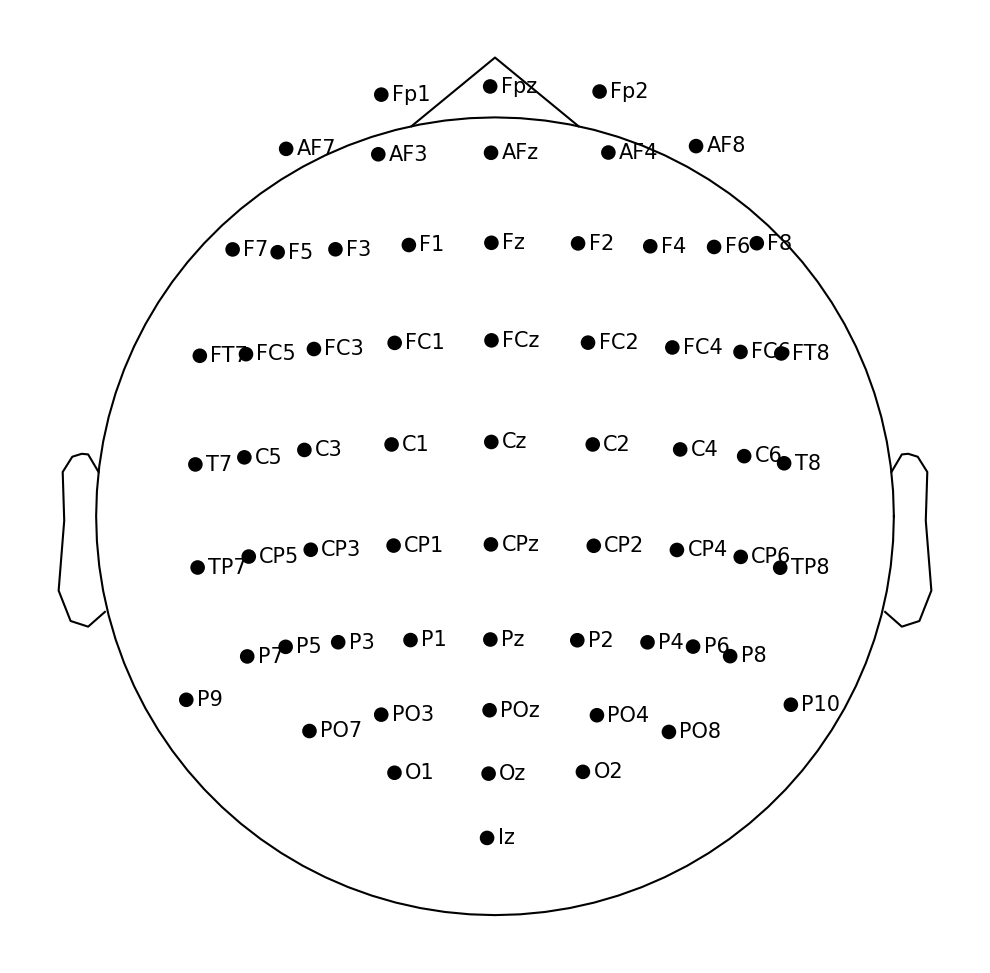

In [4]:
import mne

# row array for MNE
raw = processor.signal_left_arm_raws

# Create an info structure with only the number of channels
info = mne.create_info(ch_names=raw.ch_names, sfreq=raw.info['sfreq'], ch_types='eeg')

# Apply the 10-20 montage
montage = mne.channels.make_standard_montage('standard_1020')
info.set_montage(montage)

# Create a new RawArray with the updated info
raw = mne.io.RawArray(raw.get_data(), info)

# Show information about the updated RawArray
print(raw.info)

# display the montage (sensors on the scalp)
plt.rcParams['figure.dpi'] = 150
#raw.plot_sensors(ch_type='eeg',show_names=True, kind='3d')
#plt.show()
raw.plot_sensors(ch_type='eeg',show_names=True)
plt.show()



### Filtering options

In [5]:
# Normalize data
data = raw.get_data()

# Z-score normalization
mean = np.mean(data, axis=1, keepdims=True)
std = np.std(data, axis=1, keepdims=True)
normalized_data = (data - mean) / std

# Create a new RawArray with the normalized data
raw = mne.io.RawArray(normalized_data, raw.info)

Creating RawArray with float64 data, n_channels=64, n_times=237960
    Range : 0 ... 237959 =      0.000 ...   232.382 secs
Ready.


Setting up band-pass filter from 10 - 50 Hz



IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 10.00, 50.00 Hz: -6.02, -6.02 dB

Using matplotlib as 2D backend.


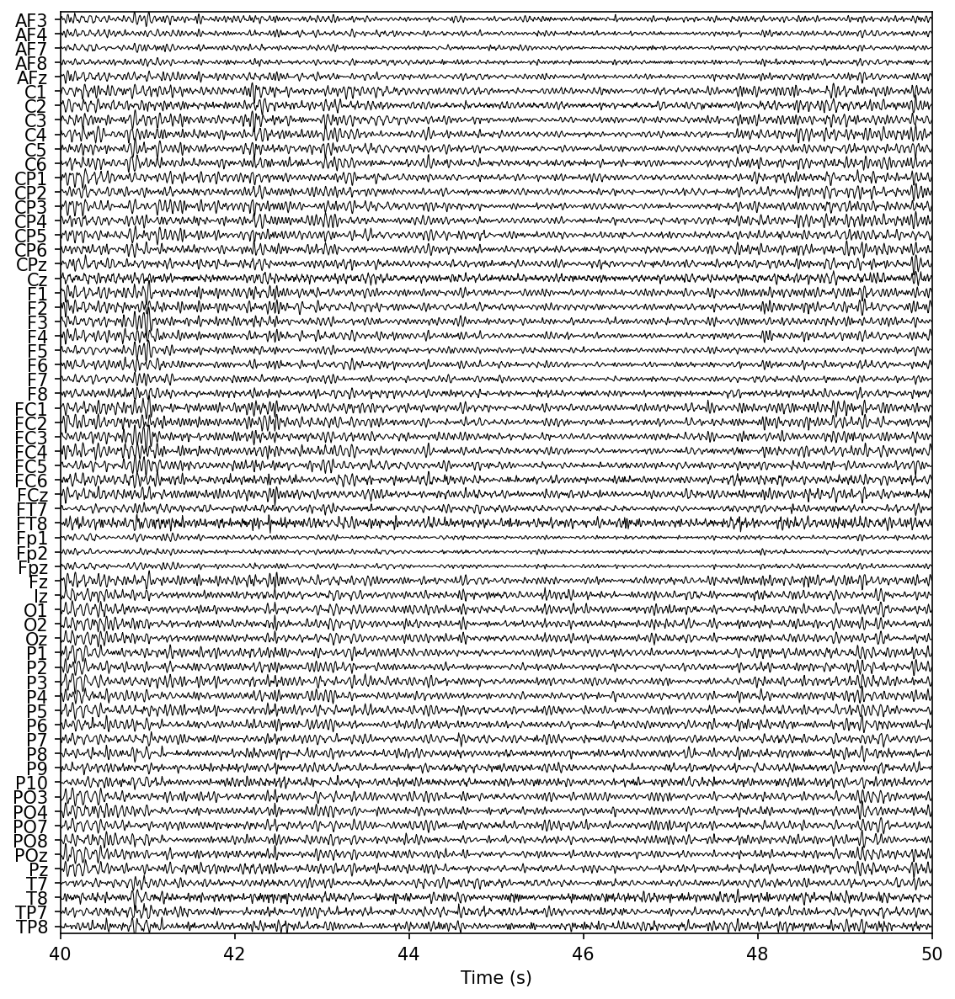

In [6]:
plt.rcParams['figure.dpi'] = 150
scal = dict(eeg=2)                      # EDIT ME!
raw.plot(n_channels=64, scalings=scal,
         start=40, duration=10,             # EDIT ME!
         lowpass=50, highpass=10,          # EDIT ME!
         show_scrollbars=False, show_scalebars=False)
plt.show()

### Show some of the studied events

In [7]:
events = processor.movement_index_left_arm
events

array([ 1684,  1685,  1686, ..., 27949, 27950, 27951])

Setting up band-pass filter from 10 - 50 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 10.00, 50.00 Hz: -6.02, -6.02 dB



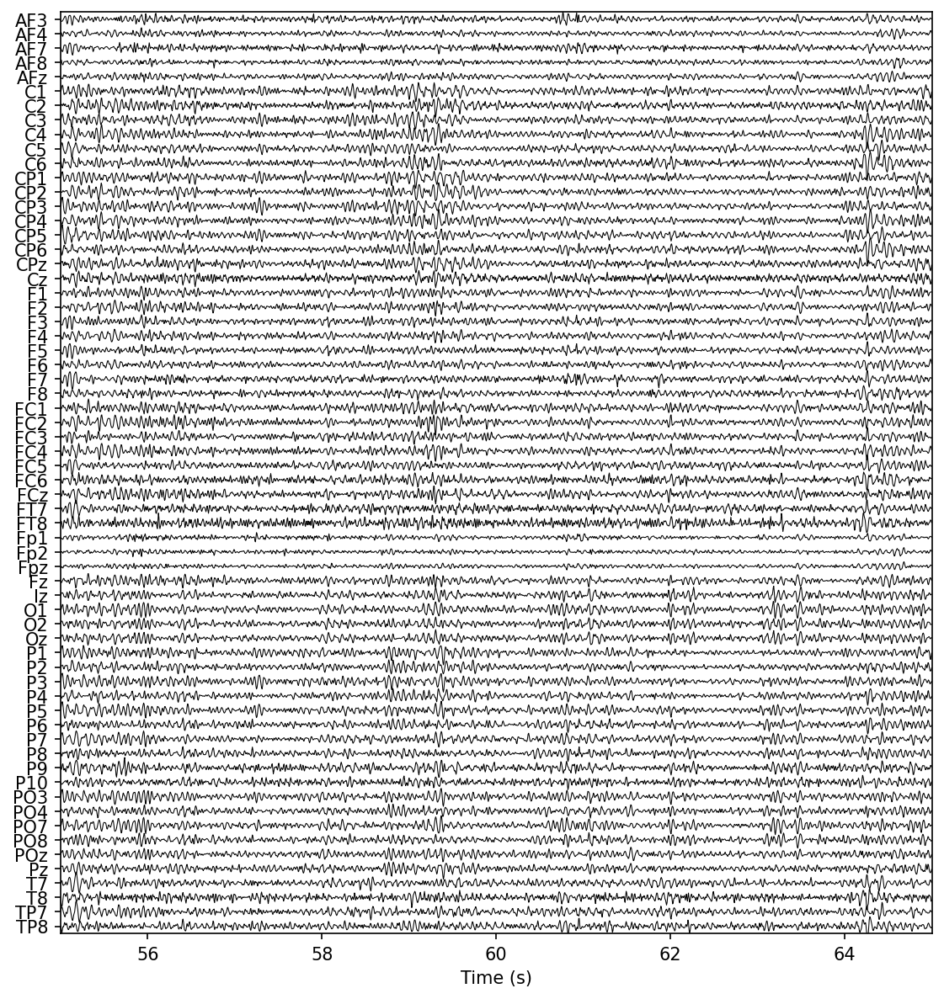

61.368
61.376
61.384
61.392
61.4
61.408
61.416
61.424
61.432
61.44
61.448
61.456
61.464
61.472
61.48
61.488
61.496
61.504
61.512
61.52
61.528
61.536
61.544
61.552
61.56
61.568
61.576
61.584
61.592
61.6
61.608
61.616
61.624
61.632
61.64
61.648
61.656
61.664
61.672
61.68
61.688
61.696
61.704
61.712
61.72
61.728
61.736
61.744
61.752
61.76
61.768
61.776
61.784
61.792
61.8
61.808
61.816
61.824
61.832
61.84
61.848
61.856
61.864
61.872
61.88
61.888
61.896
61.904
61.912
61.92
61.928
61.936
61.944
61.952
61.96
61.968
61.976
61.984
61.992
62.0
62.008
62.016
62.024
62.032
62.04
62.048
62.056
62.064
62.072
62.08
62.088
62.096
62.104
62.112
62.12
62.128
62.136
62.144
62.152
62.16
62.168
62.176
62.184
62.192
62.2
62.208
62.216
62.224
62.232
62.24
62.248
62.256
62.264
62.272
62.28
62.288
62.296
62.304
62.312
62.32
62.328
62.336
62.344
62.352
62.36
62.368
62.376
62.384
62.392
62.4
62.408
62.416
62.424
62.432
62.44
62.448
62.456
62.464
62.472
62.48
62.488
62.496
62.504
62.512
62.52
62.528
62.536
62.544

In [13]:
from mne import find_events

# Get the event (left / right hand) by looking at the "stim" channel.
events = processor.movement_index_left_arm/processor.acceleration_freq

# Display tge EEG signals with the events 
scal = dict(eeg=5e-3)     # EDIT ME!
plt.rcParams['figure.dpi'] = 150
scal = dict(eeg=2)                      # EDIT ME!
fig = raw.plot(n_channels=64, scalings=scal,
         start=55, duration=10,             # EDIT ME!
         lowpass=50, highpass=10,          # EDIT ME!
         show_scrollbars=False, show_scalebars=False)

for index in events:
    if 50 <= index <= 100:
        print(index)
        fig.mne.ax_main.axvline(index, color='green', linestyle='--')
        #ax.vlines(index, ymin=mne_fig.axes[0].get_ylim()[0], ymax=mne_fig.axes[0].get_ylim()[1], colors='red')

plt.show()

### Power Spectral Density

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 10 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 10.00
- Lower transition bandwidth: 2.50 Hz (-6 dB cutoff frequency: 8.75 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1353 samples (1.321 s)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 2.000 (s)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
/Users/lynarayanne/opt/anaconda3/lib/python3.9/site-packages/mne/viz/utils.py:161: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


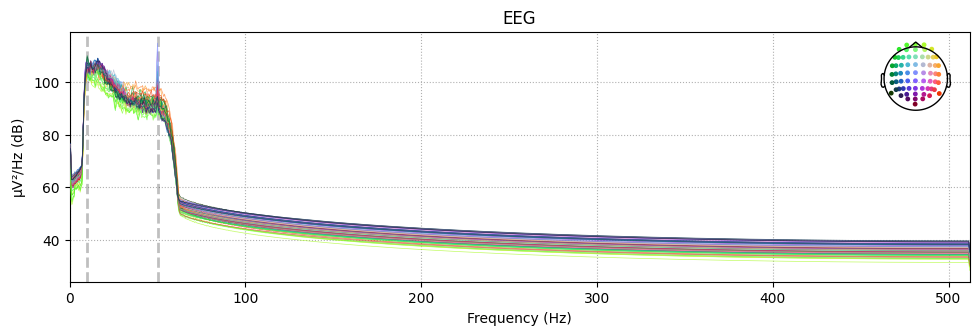

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
Effective window size : 2.000 (s)


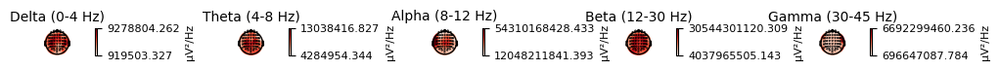

In [21]:
raw_croped = raw.copy().crop(tmin=50, tmax=100)

# filter data
raw_croped.filter(l_freq=10, h_freq=50)

# plot power spectral density
raw_croped.plot_psd()
plt.show()

# topomap with power spectral densities
plt.rcParams['figure.dpi'] = 100
fig = raw_croped.plot_psd_topomap()
fig.set_size_inches(20, 12) 
plt.show()